# **Cadenas de Markov en telecomunicaciones**
---
¡La idea de este notebook es ver como se pueden aplicar las cadenas de markov a un ejercicio real en las telecomunicaciones!

Los procesos de Markov son muy útiles en telecomunicaciones, especialmente para modelar sistemas donde el estado futuro depende solo del estado presente y no del historial previo.
Vamos a simular una cadena de Markov donde los estados representan eventos en telecomunicaciones, como la transición entre niveles de señal o la ocupación de canales en una celda.


## Procedimiento

Voy a generar una simulación simple donde modelamos la variación de la señal móvil con tres estados:

* Buena (B)

* Regular (R)

* Mala (M)

Y usamos una matriz de transición para modelar cómo cambia la señal con el tiempo. La simulación de la variación de la señal móvil usando una cadena de Markov.


In [1]:
import numpy as np
import matplotlib.pyplot as plt
import networkx as nx

In [2]:
# Definir los estados de la señal
estados = ["Buena", "Regular", "Mala"]

In [3]:
# Matriz de transición de Markov (probabilidades de cambio entre estados)
P = np.array([[0.7, 0.2, 0.1],  # De Buena -> [Buena, Regular, Mala]
              [0.3, 0.4, 0.3],  # De Regular -> [Buena, Regular, Mala]
              [0.2, 0.3, 0.5]]) # De Mala -> [Buena, Regular, Mala]

In [4]:
P

array([[0.7, 0.2, 0.1],
       [0.3, 0.4, 0.3],
       [0.2, 0.3, 0.5]])

In [5]:
# Crear un grafo dirigido
G = nx.DiGraph()

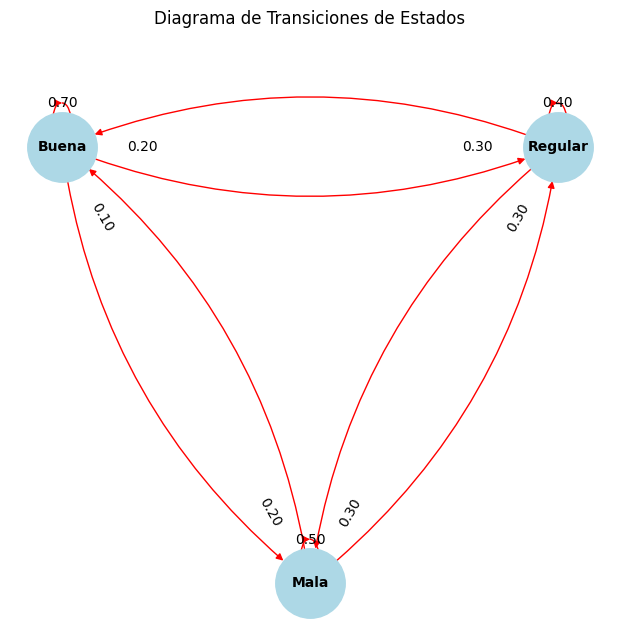

In [7]:
# Definir los estados y la matriz de transición
estados = ["Buena", "Regular", "Mala"]
matriz_transicion = P

# Crear el grafo dirigido
G = nx.DiGraph()

# Agregar nodos
for estado in estados:
    G.add_node(estado)

# Agregar aristas con pesos (probabilidades)
for i, origen in enumerate(estados):
    for j, destino in enumerate(estados):
        if matriz_transicion[i, j] > 0:
            if i == j:
                # Bucle en el mismo estado
                G.add_edge(origen, destino, weight=matriz_transicion[i, j], loop=True)
            else:
                # Transiciones entre diferentes estados
                G.add_edge(origen, destino, weight=matriz_transicion[i, j])

# Posiciones de los nodos para visualización
pos = nx.circular_layout(G)

# Ajustar posiciones manualmente para evitar superposición
pos["Buena"] = np.array([-1, 0])
pos["Regular"] = np.array([1, 0])
pos["Mala"] = np.array([0, -1])

# Dibujar el grafo
plt.figure(figsize=(6, 6))
nx.draw(G, pos, with_labels=True, node_size=2500, node_color="lightblue", edge_color="red", 
        font_size=10, font_weight="bold", connectionstyle="arc3,rad=0.2")

# Agregar etiquetas con los pesos de las transiciones
edge_labels = {(origen, destino): f"{peso:.2f}" for origen, destino, peso in G.edges(data="weight")}
nx.draw_networkx_edge_labels(G, pos, edge_labels=edge_labels, font_color='black', label_pos=0.15, bbox=dict(facecolor='white', edgecolor='none', alpha=0))

plt.title("Diagrama de Transiciones de Estados")
plt.show()


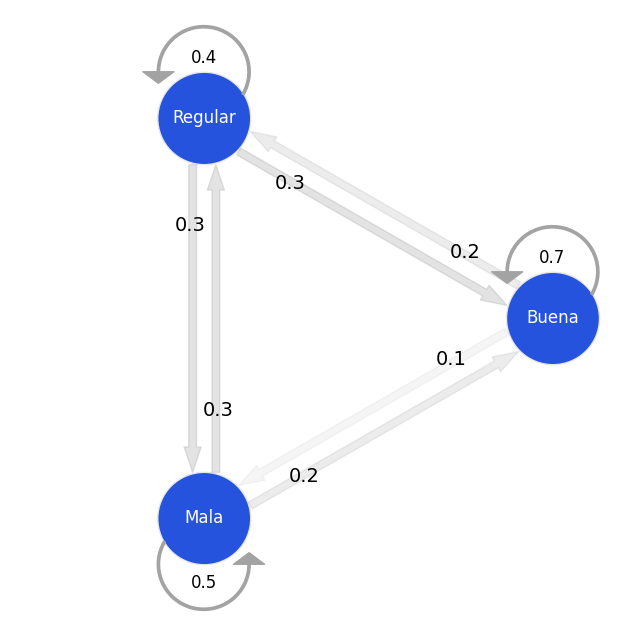

In [8]:
# Import the MarkovChain class from markovchain.py
from markovchain import MarkovChain

P = matriz_transicion # Transition matrix
mc = MarkovChain(P, ['Buena', 'Regular', 'Mala'])
mc.draw()

## Interpretación de la Matriz

Cada fila representa el estado actual, y cada columna representa el estado al que se puede transicionar.

•	Primera fila: Si la señal es Buena (B)
* Se queda en Buena con P(B→B) =0.7
* Pasa a Regular con P(B→R) =0.2
* Pasa a Mala con P(B→M) =0.1

•	Segunda fila: Si la señal es Regular (R)
* Pasa a Buena con P(R→B) =0.3
* Se queda en Regular con P(R→R) =0.4
* Pasa a Mala con P(R→M) =0.3

•	Tercera fila: Si la señal es Mala (M)
* Pasa a Buena con P(M→B) =0.2
* Pasa a Regular con P(M→R) =0.3
* Se queda en Mala con P(M→M) =0.5

## Propiedades Claves

1.	Cada fila suma 1, porque representa todas las posibles transiciones desde un estado dado.
2.	Es un proceso de Markov, porque el siguiente estado depende solo del estado actual, no del historial previo.



In [9]:
# Simulación de la cadena de Markov
np.random.seed(42)
num_pasos = 100  # Número de transiciones
estado_actual = 0  # Empezamos en el estado "Buena"
historial_estados = [estado_actual]

In [10]:
for _ in range(num_pasos):
    estado_actual = np.random.choice([0, 1, 2], p=P[estado_actual])
    historial_estados.append(estado_actual)

In [11]:
# Convertir a nombres de estados
historial_nombres = [estados[i] for i in historial_estados]

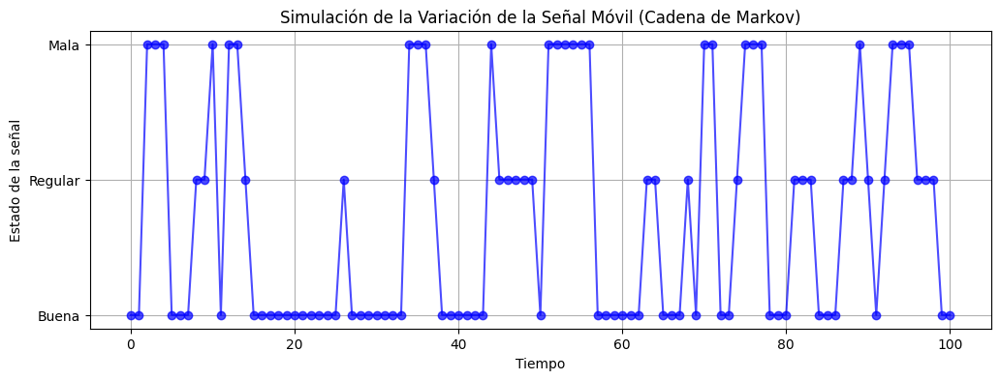

In [12]:
# Graficar la evolución de los estados
plt.figure(figsize=(12, 4))
plt.plot(historial_estados, marker="o", linestyle="-", color="b", alpha=0.7)
plt.yticks([0, 1, 2], estados)
plt.xlabel("Tiempo")
plt.ylabel("Estado de la señal")
plt.title("Simulación de la Variación de la Señal Móvil (Cadena de Markov)")
plt.grid(True)
plt.show()

In [13]:
# Mostrar los primeros 20 estados
print(historial_nombres[:20])

['Buena', 'Buena', 'Mala', 'Mala', 'Mala', 'Buena', 'Buena', 'Buena', 'Regular', 'Regular', 'Mala', 'Buena', 'Mala', 'Mala', 'Regular', 'Buena', 'Buena', 'Buena', 'Buena', 'Buena']


## Resultado

* La gráfica muestra cómo cambia la señal con el tiempo.
* La lista con los primeros 100 estados de la simulación muestra transiciones entre Buena, Regular y Mala según la matriz de transición definida.
* La matriz de transición define las probabilidades de pasar de un estado a otro en la cadena de Markov.


## DATOS SIMULADOS PARA 5000 USUARIOS

La idea es simular los datos de 5000 usuarios para calcular una matriz de transición más robusta.

Para que la matriz de transición refleje la realidad, podemos estimarla a partir de datos reales. En telecomunicaciones, esto puede lograrse analizando los registros de calidad de señal de los usuarios.

1. **Recolectar Datos de Señal Móvil**
   
Necesitamos datos de usuarios en diferentes estados de señal (Buena, Regular, Mala) en diferentes momentos. Esto se puede obtener de:

* Registros de medición de red (drive tests): Miden la señal en ubicaciones y tiempos específicos.
* Datos de CDRs (Call Detail Records): Los operadores registran eventos de usuarios con su calidad de señal.
* Monitoreo en tiempo real: Algunos sistemas almacenan la calidad de señal de los usuarios periódicamente.

Una vez tenemos los datos de RSSI, podemos definir rangos de niveles y tipificarlos como Bueno, Regular o Malo.
Si prefieres más estados (por ejemplo, "Muy Buena", "Deficiente") limitar los rangos de niveles de RSSI y definir de acuerdo a tu interes.

Para estimar una matriz de transición confiable, necesitamos una muestra suficientemente grande para que las probabilidades reflejen la realidad de la red.

2. **Factores a Considerar**

* Variabilidad en la red: Diferentes regiones pueden tener condiciones distintas (urbano, rural, montañoso, etc.).
* Frecuencia de medición: Si tienes datos cada segundo, menos usuarios pueden ser suficientes. Si es cada hora, necesitas más.
* Precisión requerida: ¿Necesitas un modelo general o granular por región, operador, tecnología (2G/3G/4G/5G)?




In [14]:
import pandas as pd

In [15]:
# Parámetros de la simulación
num_usuarios = 5000  # Número de usuarios simulados
num_pasos = 10  # Número de mediciones por usuario

# Estados posibles de la señal
estados = ["Buena", "Regular", "Mala"]

In [16]:
# Generar estados aleatorios para cada usuario en diferentes tiempos
np.random.seed(42)
datos = {
    "Usuario": np.repeat(np.arange(1, num_usuarios + 1), num_pasos),
    "Tiempo": np.tile(np.arange(1, num_pasos + 1), num_usuarios),
    "Estado": np.random.choice([0, 1, 2], size=num_usuarios * num_pasos)  # 0=Buena, 1=Regular, 2=Mala
}

In [17]:
# Crear DataFrame con la información
df = pd.DataFrame(datos)


In [18]:
df.head()

,Usuario,Tiempo,Estado
0,1,1,2
1,1,2,0
2,1,3,2
3,1,4,2
4,1,5,0


In [19]:
# Agregar la columna del siguiente estado (desplazada)
df["Estado_Siguiente"] = df.groupby("Usuario")["Estado"].shift(-1)

In [20]:
# Eliminar filas con NaN (última medición de cada usuario no tiene siguiente estado)
df = df.dropna().astype(int)

In [21]:
# Mostrar primeras filas
df.head(10)

,Usuario,Tiempo,Estado,Estado_Siguiente
0,1,1,2,0
1,1,2,0,2
2,1,3,2,2
3,1,4,2,0
4,1,5,0,0
5,1,6,0,2
6,1,7,2,1
7,1,8,1,2
8,1,9,2,2
10,2,1,2,2


## ¿Qué datos tenemos?

Nuestra tabla tiene las siguientes columnas:

| **Uusario** | **Tiempo** | **Estado** | **Estado_Siguiente** |
| --- | --- | --- | --- |
| **`1`** | 1 | **`2 (Mala)`** | **`0 (Buena)`** |
| **`1`** | 2 | **`0 (Buena)`** | **`2 (Mala)`** |
| **`1`**  | 3 | **`2 (Mala)`** |**`2 (Mala)`** |
| **`1`**  | 4 | **`2 (Mala)`** | **`0 (Buena)`** |
| **`1`**  | 5 | **`0 (Buena)`** | **`0 (Buena)`** |

Cada fila representa el estado de un usuario en un instante de tiempo y a qué estado cambia después.

## Contar cuántas veces ocurre cada transición

Usamos pd.crosstab() para contar cuántas veces ocurre cada transición de un estado a otro:

In [22]:
# Calcular la matriz de transición
conteo_transiciones = pd.crosstab(df["Estado"], df["Estado_Siguiente"])
matriz_transicion = pd.crosstab(df["Estado"], df["Estado_Siguiente"], normalize="index").values

In [23]:
conteo_transiciones

Estado_Siguiente,0,1,2
Estado,,,
0,5044,4981,5000
1,4950,5078,5025
2,5036,4980,4906


## Convertir a probabilidades

Ahora, convertimos estas frecuencias en probabilidades, dividiendo cada celda entre la suma total de la fila a la cual pertenece:

In [24]:
# Mostrar la matriz de transición
print("Matriz de transición calculada:")
print(matriz_transicion)

Matriz de transición calculada:
[[0.336 0.332 0.333]
 [0.329 0.337 0.334]
 [0.337 0.334 0.329]]


## Interpretación:

Fila 0 (Buena):

* 33.57% de probabilidad de seguir en Buena
* 33.15% de probabilidad de cambiar a Regular
* 33.27% de probabilidad de cambiar a Mala

Fila 1 (Regular):

* 32.88% de probabilidad de cambiar a Buena
* 33.73% de probabilidad de seguir en Regular
* 33.38% de probabilidad de cambiar a Mala

Fila 2 (Mala):

* 33.74% de probabilidad de cambiar a Buena
* 33.37% de probabilidad de cambiar a Regular
* 32.87% de probabilidad de seguir en Mala

## Simulación para 1 usuario

In [25]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

In [26]:
# Estados en texto para la gráfica
estados_texto = ["Buena", "Regular", "Mala"]
colores = ["green", "orange", "red"]

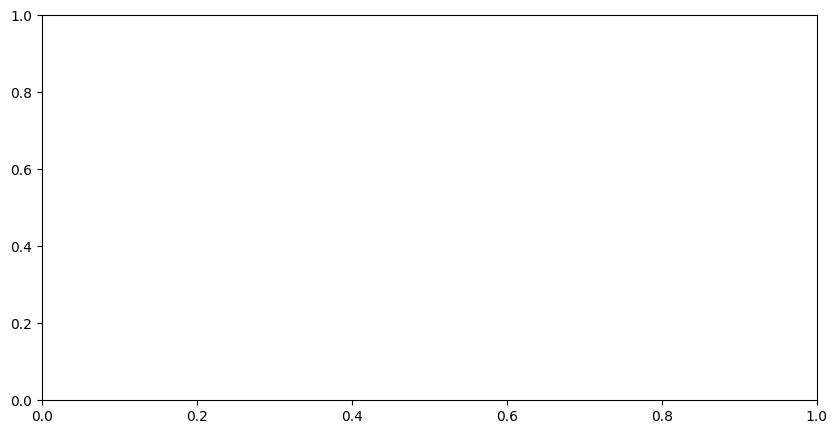

In [27]:
# Simulación de la evolución de un usuario
num_simulaciones = 100  # Número de pasos a simular
estado_actual = np.random.choice([0, 1, 2])
evolucion_estados = [estado_actual]

for _ in range(num_simulaciones - 1):
    estado_actual = np.random.choice([0, 1, 2], p=matriz_transicion[estado_actual])
    evolucion_estados.append(estado_actual)

# Crear la figura
fig, ax = plt.subplots(figsize=(10, 5))

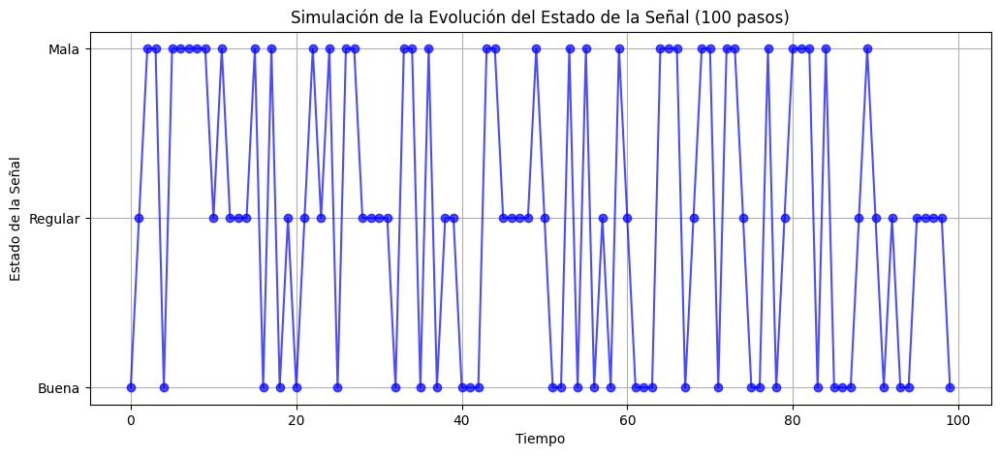

In [28]:
# Graficar la evolución de los estados
plt.figure(figsize=(12, 5))
plt.plot(evolucion_estados, marker="o", linestyle="-", color="b", alpha=0.7)
plt.yticks([0, 1, 2], ["Buena", "Regular", "Mala"])
plt.xlabel("Tiempo")
plt.ylabel("Estado de la Señal")
plt.title("Simulación de la Evolución del Estado de la Señal (100 pasos)")
plt.grid(True)
plt.show()

In [29]:
# Crear una figura y ejes para la animación
def actualizar(frame):
    ax.clear()
    ax.set_ylim(-0.5, 2.5)
    ax.set_xlim(0, num_simulaciones)
    
    # Etiquetas de los ejes
    ax.set_xlabel("Tiempo")
    ax.set_ylabel("Estado de Señal")
    
    # Etiquetas y valores del eje Y
    ax.set_yticks([0, 1, 2])
    ax.set_yticklabels(estados_texto)
    
    # Agregar título
    ax.set_title("Evolución de la Señal en el Tiempo")
    
    # Agregar una cuadrícula para mejor visualización
    ax.grid(True, linestyle="--", alpha=0.5)

    # Dibujar los puntos y la línea de evolución
    ax.scatter(range(frame + 1), evolucion_estados[:frame + 1], 
               c=[colores[i] for i in evolucion_estados[:frame + 1]], s=100)
    ax.plot(range(frame + 1), evolucion_estados[:frame + 1], linestyle='-', color='black', alpha=0.5)

In [30]:
# Crear la animación
ani = animation.FuncAnimation(fig, actualizar, frames=num_simulaciones, interval=500, repeat=False)

In [31]:
# Mostrar en Jupyter Notebook
HTML(ani.to_jshtml())

In [32]:
# Guardar la animación en un archivo GIF
anim_filename = "simulacion_markov.gif"
ani.save(anim_filename, writer="pillow", fps=5)

In [33]:
# Devolver el archivo para descarga
anim_filename

'simulacion_markov.gif'

# Agregando más estados

Vamos a reducir los rangos de niveles RSSI para definir más estados y poder simularlos:

* Muy Buena (3) → Azul
* Buena (2) → Verde
* Regular (1) → Naranja
* Mala (0) → Rojo
* Deficiente (-1) → Morado

In [34]:
# Definir la matriz de transición con más estados - tener en cuenta que cambiamos el orden de los estados en la matriz.
# Empezamos ahora por "deficiente" en la primera fila y la última fila es "muy buena"

matriz_transicion = np.array([
    [0.6, 0.3, 0.1, 0.0, 0.0],  # Deficiente (-1) → Puede mejorar
    [0.2, 0.5, 0.2, 0.1, 0.0],  # Mala (0)
    [0.1, 0.3, 0.4, 0.2, 0.0],  # Regular (1)
    [0.0, 0.1, 0.3, 0.4, 0.2],  # Buena (2)
    [0.0, 0.0, 0.1, 0.3, 0.6]   # Muy Buena (3) → Se mantiene estable
])

In [35]:
# Estados y colores
estados_texto = ["Deficiente", "Mala", "Regular", "Buena", "Muy Buena"]
colores = ["purple", "red", "orange", "green", "blue"]

## Diagrama de estados

Veremos el diagrama de estados con su respectivo valor de probabilidad correspondiente al paso a otro estado o permanecer en el mismo estado.

La etiqueta del valor de la probabilidad esta cerca al nodo y en la linea correspondiente hacía donde apunta.

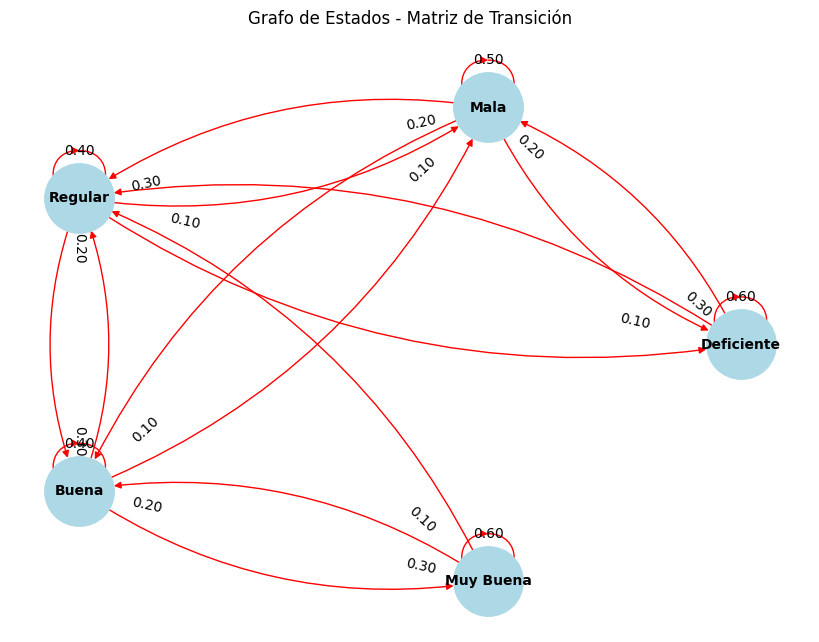

In [36]:

# Estados y nombres
estados = estados_texto

# Crear un grafo dirigido
G = nx.DiGraph()

# Agregar nodos (estados)
for estado in estados:
    G.add_node(estado)

# Agregar transiciones (aristas con pesos)
for i in range(len(estados)):
    for j in range(len(estados)):
        probabilidad = matriz_transicion[i, j]
        if probabilidad > 0:  # Solo agregamos conexiones con probabilidad mayor a 0
            G.add_edge(estados[i], estados[j], weight=probabilidad)


# Posiciones de los nodos para visualización
pos = nx.circular_layout(G)

# Dibujar nodos y etiquetas

# Dibujar el grafo
plt.figure(figsize=(8, 6))
nx.draw(G, pos, with_labels=True, node_size=2500, node_color="lightblue", edge_color="red", 
        font_size=10, font_weight="bold", connectionstyle="arc3,rad=0.2")

# Dibujar las etiquetas de las probabilidades en las aristas
edge_labels = {(estados[i], estados[j]): f"{matriz_transicion[i, j]:.2f}" for i in range(len(estados)) for j in range(len(estados)) if matriz_transicion[i, j] > 0}
nx.draw_networkx_edge_labels(G, pos, edge_labels=edge_labels, font_color='black', label_pos=0.15, bbox=dict(facecolor='white', edgecolor='none', alpha=0))


# Mostrar el grafo
plt.title("Grafo de Estados - Matriz de Transición")
plt.show()


## Simulación

In [37]:
# Parámetros de simulación
num_pasos = 100
estado_actual = 0  # Comenzamos en "Deficiente"
historial_estados = [estado_actual]

In [38]:
np.random.seed(42)  # Semilla para reproducibilidad

# Generar la simulación
for _ in range(num_pasos):
    estado_actual = np.random.choice(range(5), p=matriz_transicion[estado_actual])
    historial_estados.append(estado_actual)

In [39]:
# Crear una figura y ejes para la animación
def actualizar(frame):
    ax.clear()
    ax.set_ylim(-1.5, 4.5)
    ax.set_xlim(0, num_pasos)
    
    # Etiquetas de los ejes
    ax.set_xlabel("Tiempo")
    ax.set_ylabel("Estado de Señal")
    
   # Etiquetas del eje Y
    ax.set_yticks(range(0, 5))  # -1 a 3
    ax.set_yticklabels(estados_texto)
    
    # Agregar título y cuadrícula
    ax.set_title("Evolución de la Señal en el Tiempo")
       
    # Agregar una cuadrícula para mejor visualización
    ax.grid(True, linestyle="--", alpha=0.5)

    # Dibujar los puntos y la línea de evolución
    ax.scatter(range(frame + 1), historial_estados[:frame + 1], 
               c=[colores[i] for i in historial_estados[:frame + 1]], s=100)
    ax.plot(range(frame + 1), historial_estados[:frame + 1], linestyle='-', color='black', alpha=0.5)


In [40]:
# Crear la animación
ani = animation.FuncAnimation(fig, actualizar, frames=num_simulaciones, interval=500, repeat=False)

In [41]:
# Mostrar en Jupyter Notebook
HTML(ani.to_jshtml())

In [42]:
# Guardar la animación en un archivo GIF
anim_filename = "simulacion_markov_2.gif"
ani.save(anim_filename, writer="pillow", fps=5)

In [43]:
# Devolver el archivo para descarga
anim_filename

'simulacion_markov_2.gif'